### Initialization

In [2]:
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os, glob
import lanelines_camera as cam
import lanelines_colorspaces as cs
import lanelines_presentation as pres
import lanelines_linetracker as ll
%matplotlib inline

Imported Custom Lane Lines Camera Code

Imported Custom Lane Lines Colorspaces Code

Imported Custom Lane Lines Presentation Code



### Step 1 - Computing the Camera Calibration using the Checkerboard Pattern Images

20 total images, 17 success


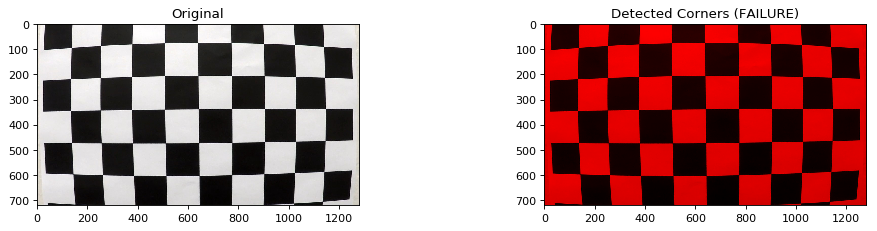

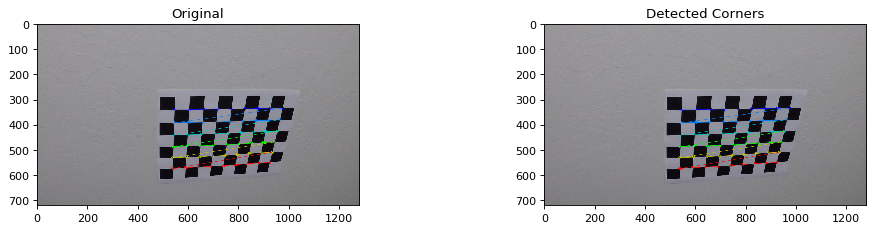

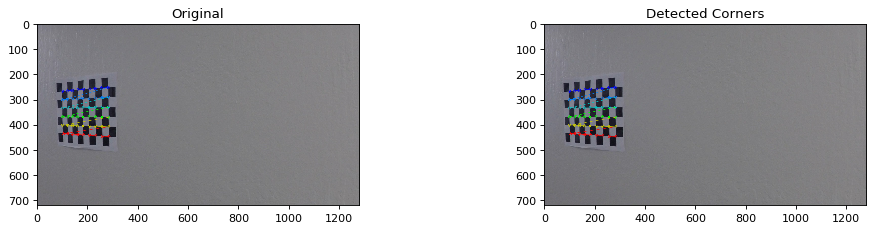

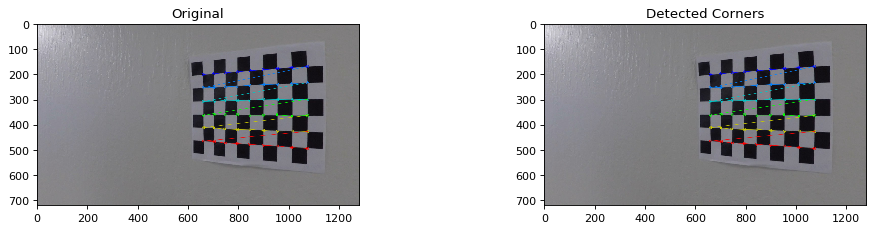

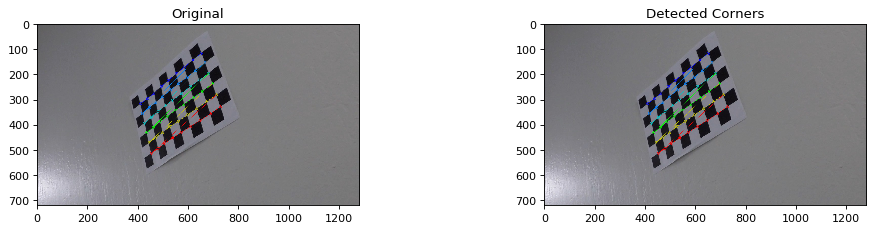

...

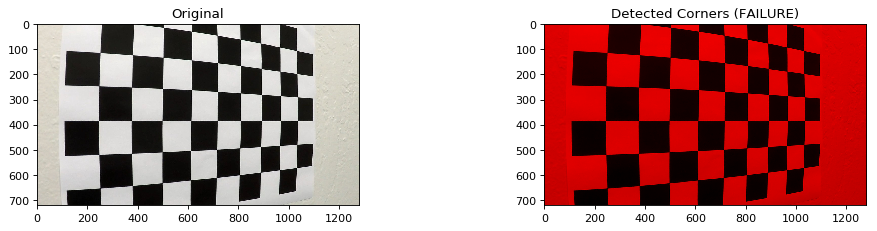

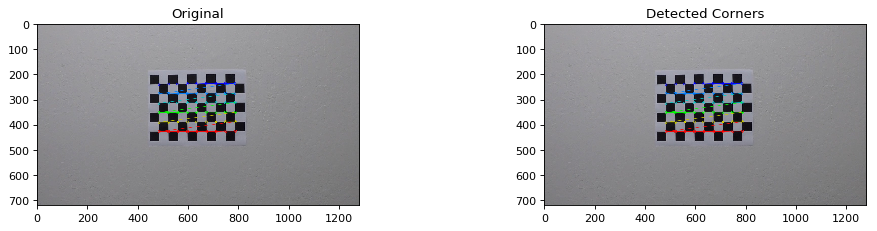

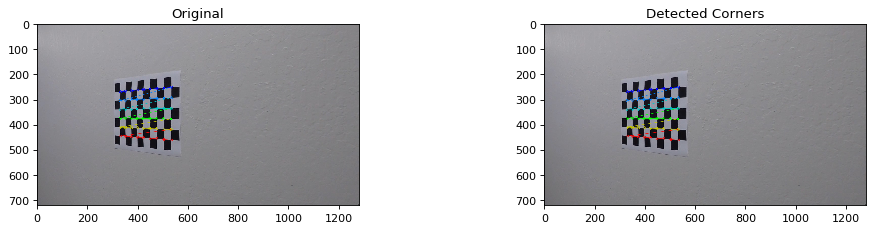

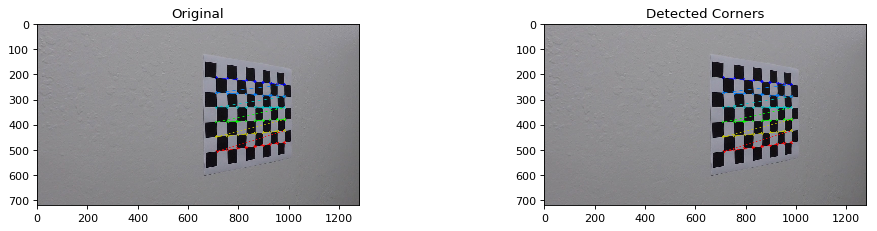

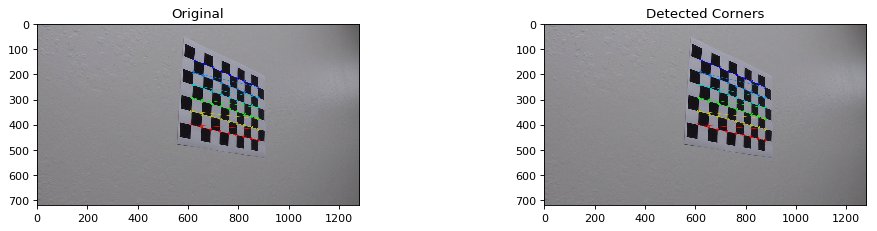

In [182]:
n_corners = (9,6)
camera_cal = cam.CAMERA_CALIBRATION(n_corners)
calibration_images = glob.glob("./camera_cal/*.jpg")
success_cnt = 0
for idx, fname in enumerate(calibration_images):
    img = mpimg.imread(fname)
    cal_image, successful_cal, corners = camera_cal.feed_image(img)
    if successful_cal:
        pres.multi_graph([img,cal_image],["Original","Detected Corners"])
        success_cnt += 1
    else:
        pres.multi_graph([img,cal_image],["Original","Detected Corners (FAILURE)"])
print ("%d total images, %d success" % (len(calibration_images),success_cnt))

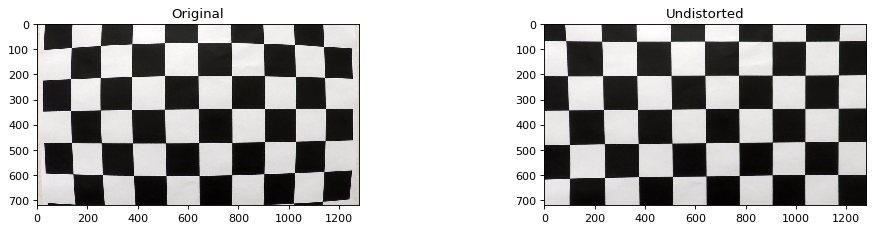

In [4]:
img = mpimg.imread('camera_cal/calibration1.jpg')
undst = camera_cal.undistort(img)
pres.multi_graph([img,undst],["Original","Undistorted"])

### Undistort Test Camera Images

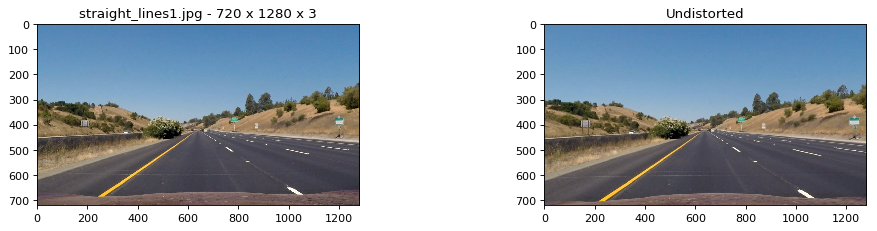

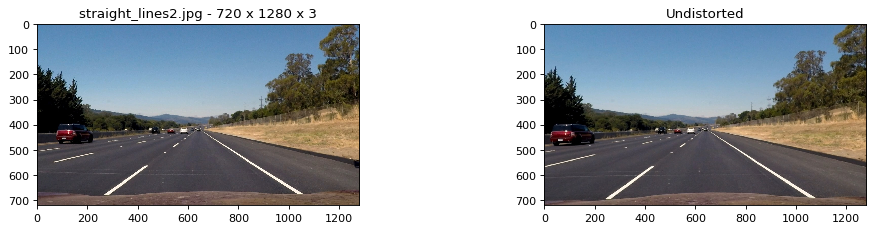

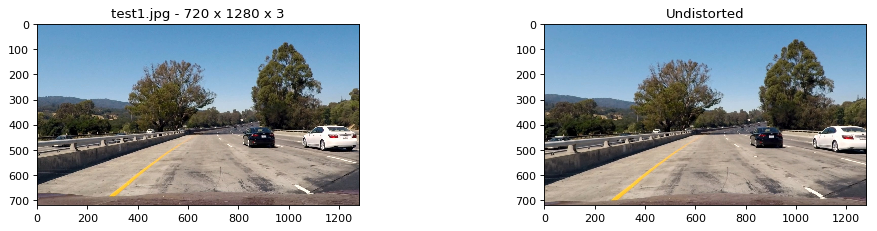

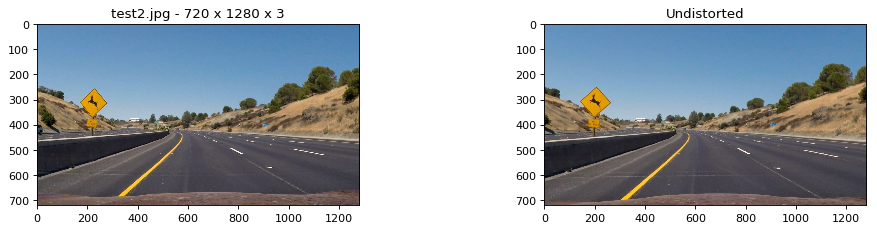

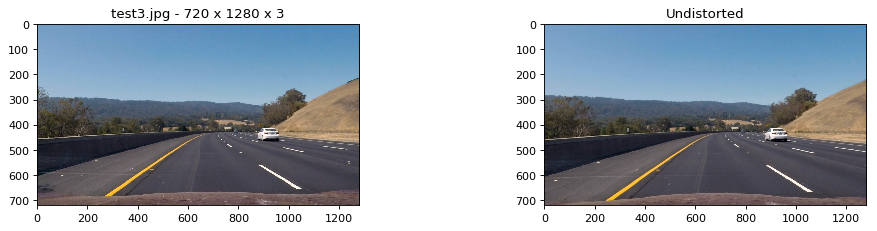

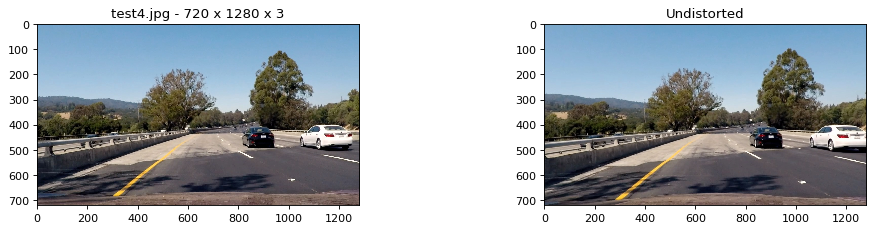

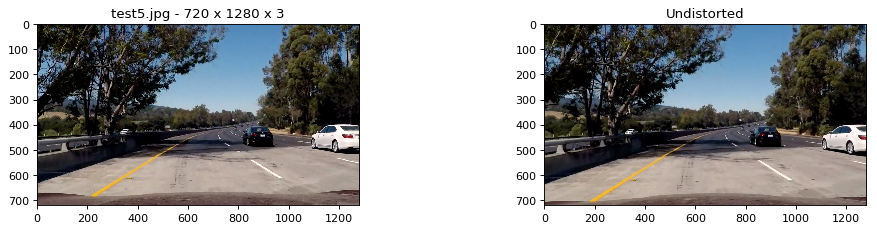

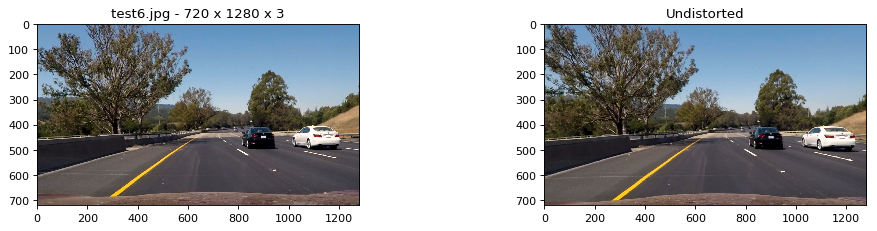

In [5]:
#undistorting test_images
test_images_fnames = glob.glob("./test_images/*.jpg")
test_images = []
test_images_undist = []
for fname in test_images_fnames:
    img = mpimg.imread(fname)
    test_images += [img]
    undist = camera_cal.undistort(img)
    test_images_undist += [undist]
    pres.multi_graph([img,undist],["%s - %s" % (fname.split("/")[-1]," x ".join(map(str,img.shape))),"Undistorted"])

### EXPERIMENTATION Convert Colorspaces and Apply Sobel Operators (Gradients / Canny Edge Detection)

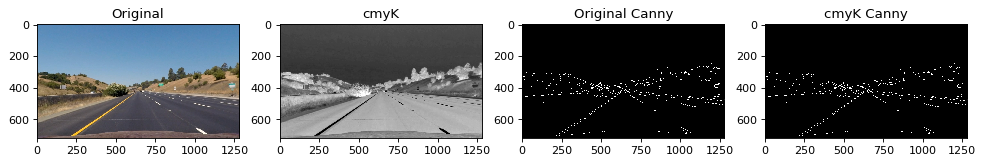

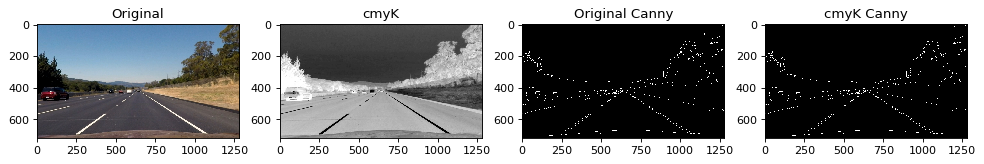

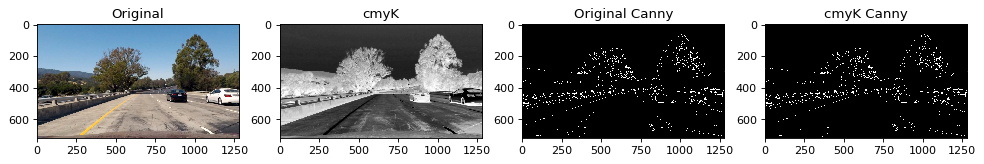

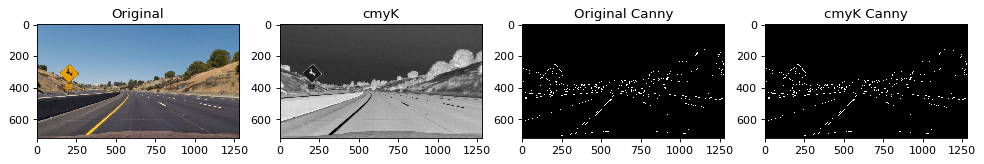

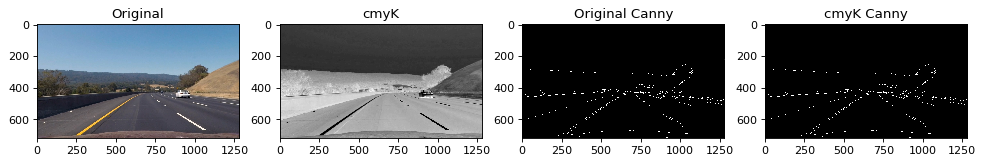

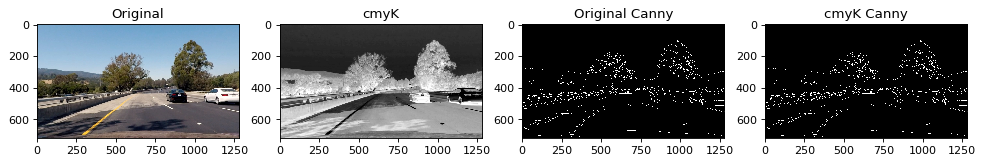

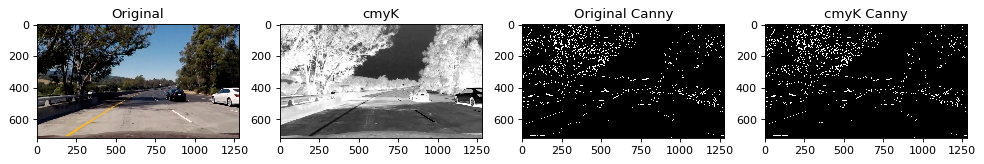

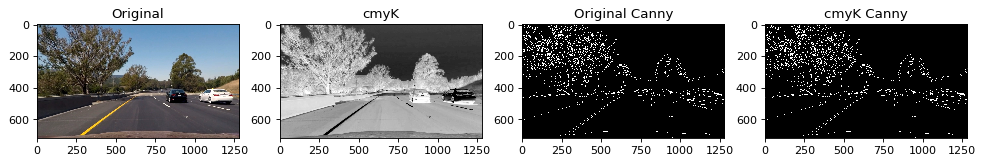

In [6]:
for idx,img in enumerate(test_images_undist):
    cmyk_version = cs.get_cmyk(test_images_undist[idx])[:,:,3]
    pres.multi_graph([img,cmyk_version,cv2.Canny(img,150,255),cv2.Canny(cmyk_version,150,255)],
                     ['Original','cmyK','Original Canny','cmyK Canny'])

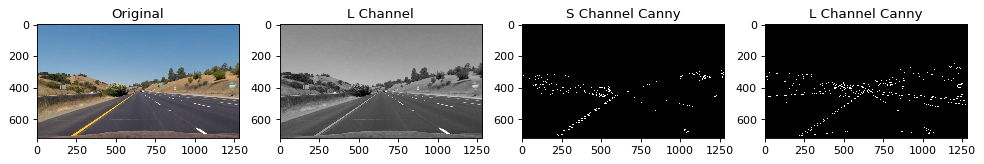

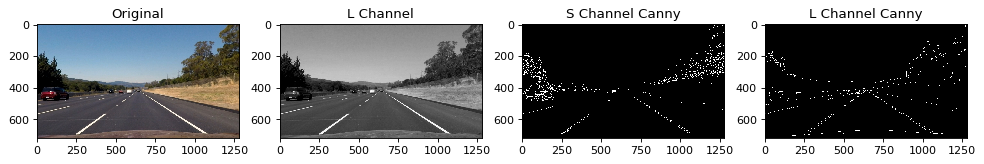

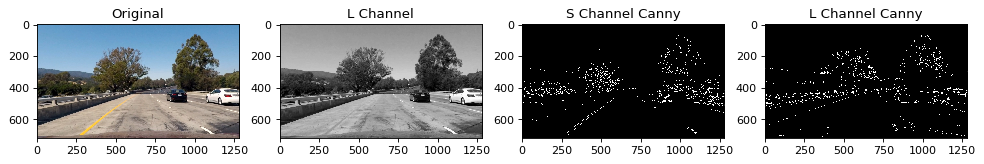

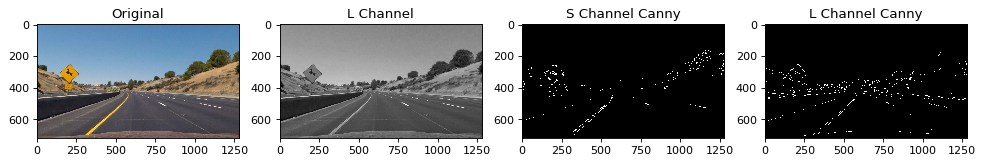

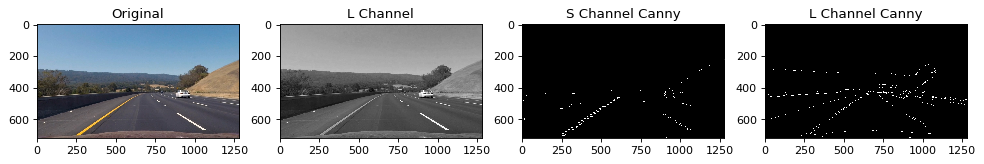

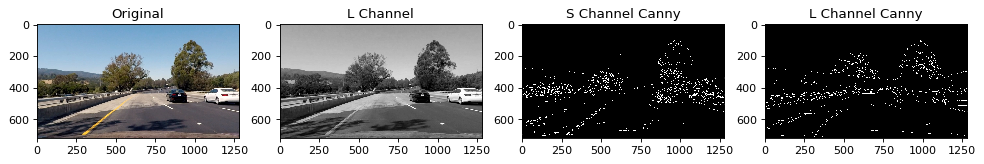

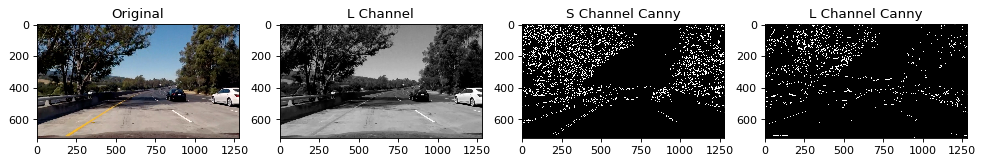

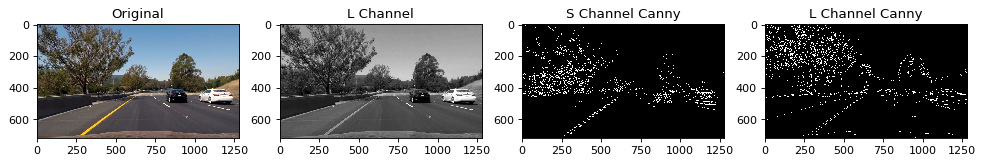

In [7]:
for idx,img in enumerate(test_images_undist):
    [h_chan,l_chan,s_chan] = cs.split_img(cs.get_hls(img))
    pres.multi_graph([img,l_chan,cv2.Canny(s_chan,150,255),cv2.Canny(l_chan,150,255)],
                     ["Original","L Channel","S Channel Canny","L Channel Canny"])

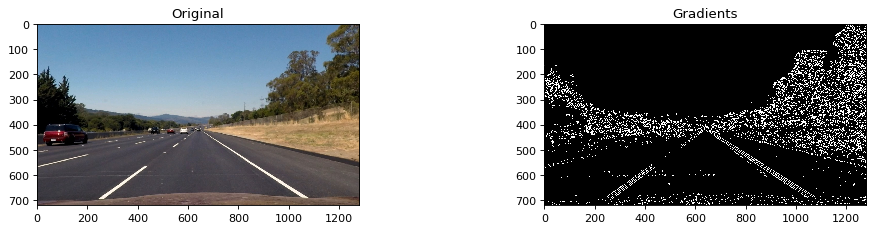

In [8]:
# Simple grayscale example of combining from lectures
for idx,img in enumerate(test_images_undist):
    if idx!=1: continue
    ksize = 3
    [h_chan,l_chan,s_chan] = cs.split_img(cs.get_hls(img))
    gradx = cs.get_sobel(h_chan, 'absx', thresh_min=20, thresh_max=100, ksize=ksize)
    grady = cs.get_sobel(img, 'absy', thresh_min=20, thresh_max=100, ksize=ksize)
    mag_binary = cs.get_sobel(img, 'abs', thresh_min=10, thresh_max=100, ksize=9)
    dir_binary = cs.get_sobel(img, 'atan', thresh_min=0.7, thresh_max=1.3, ksize=9)

    combined = np.zeros_like(dir_binary)
    combined[((gradx==1) & (grady==1)) | ((mag_binary==1) & (dir_binary==1))] = 1
    
    pres.multi_graph([img,mag_binary & dir_binary],['Original','Gradients'])

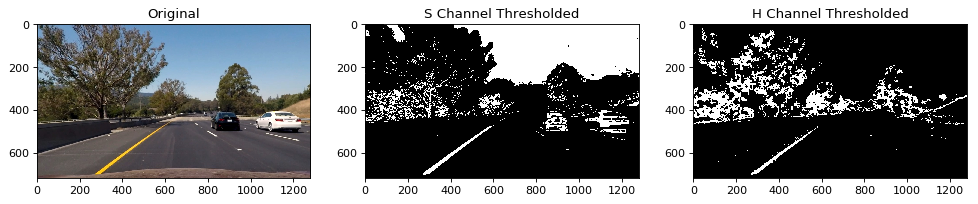

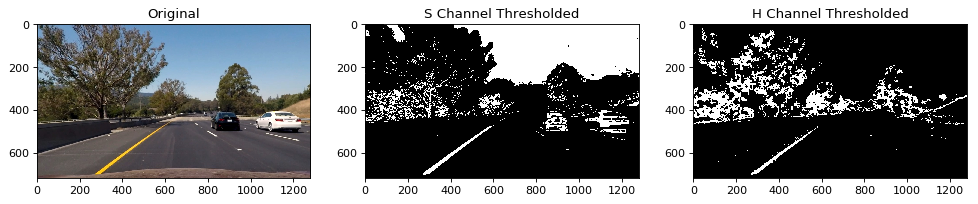

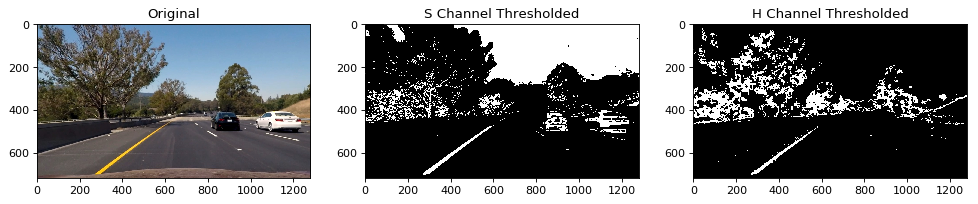

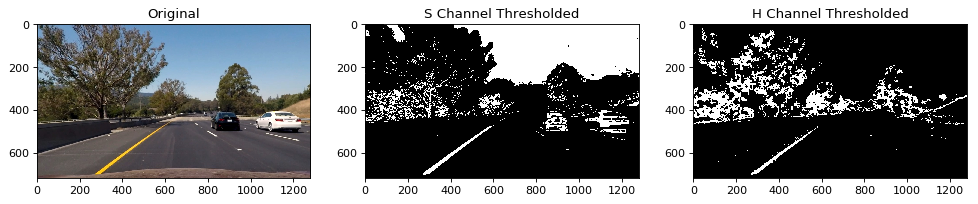

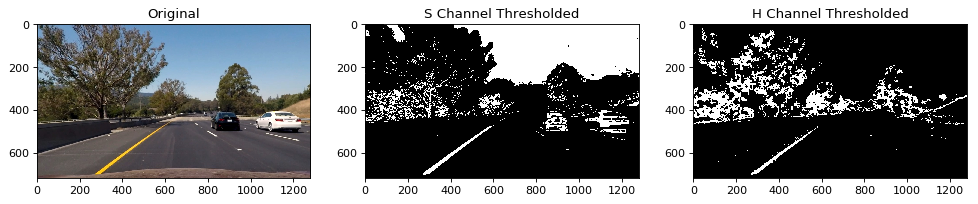

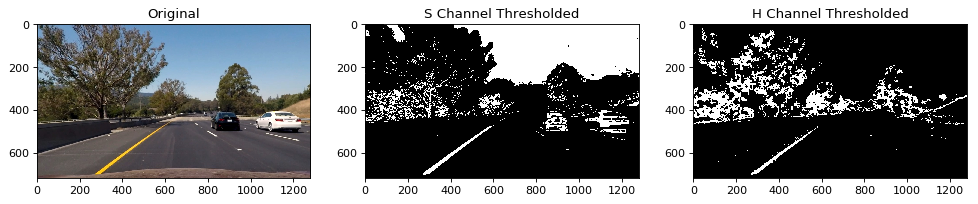

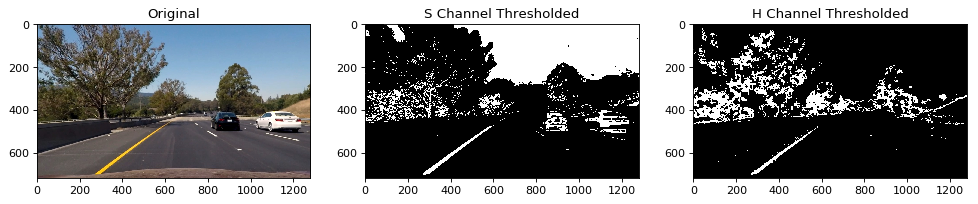

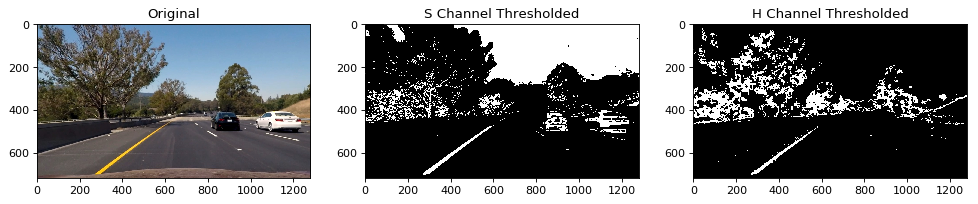

In [9]:
for idx,image in enumerate(test_images_undist):
    ksize = 3
    [h_chan,l_chan,s_chan] = cs.split_img(cs.get_hls(img))
    s_thresh = cs.get_thresh(s_chan, thresh_min=100, thresh_max=255)
    h_thresh = cs.get_thresh(h_chan, thresh_min=20, thresh_max=25) # 18, 100
    pres.multi_graph([img,s_thresh,h_thresh],["Original","S Channel Thresholded","H Channel Thresholded"])

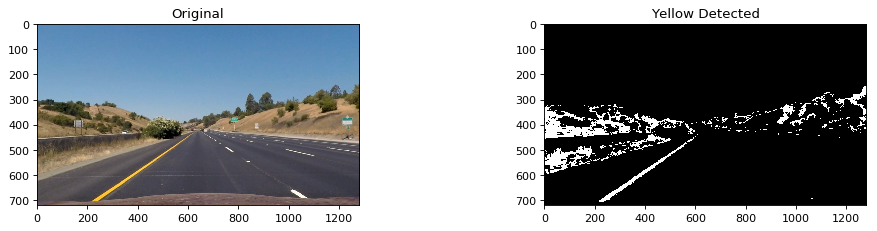

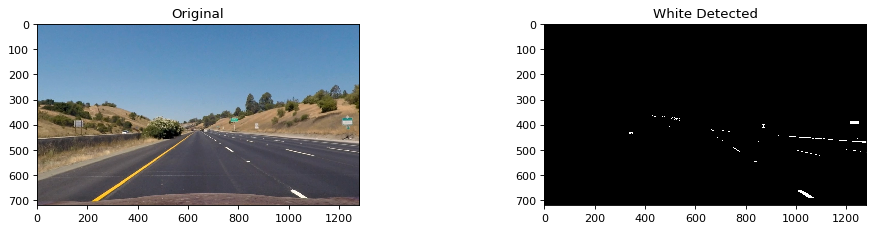

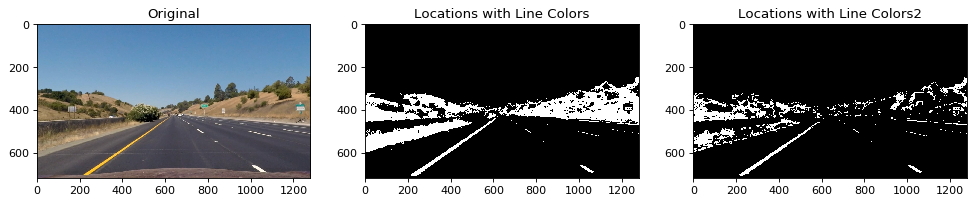

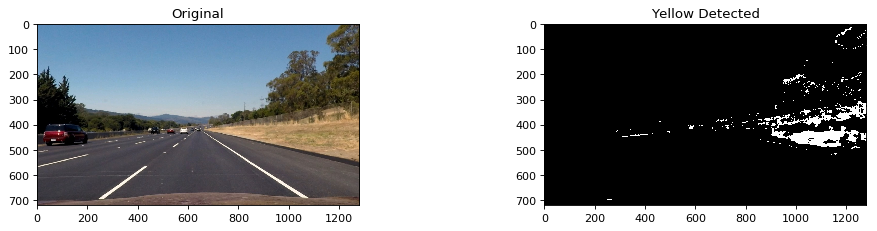

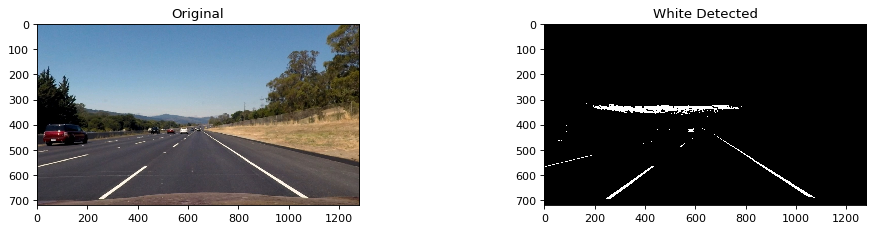

...

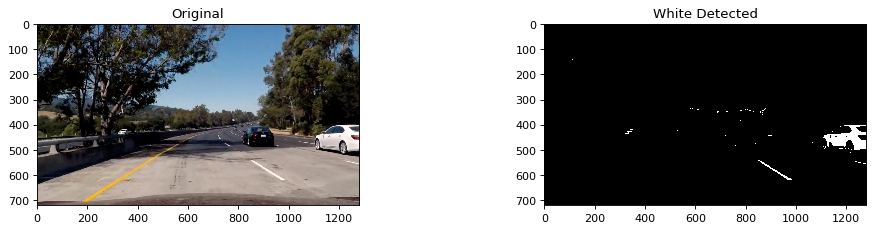

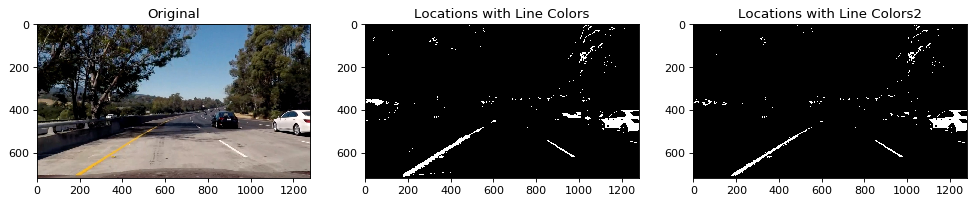

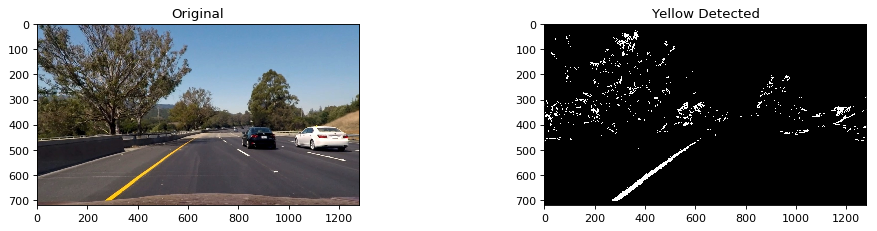

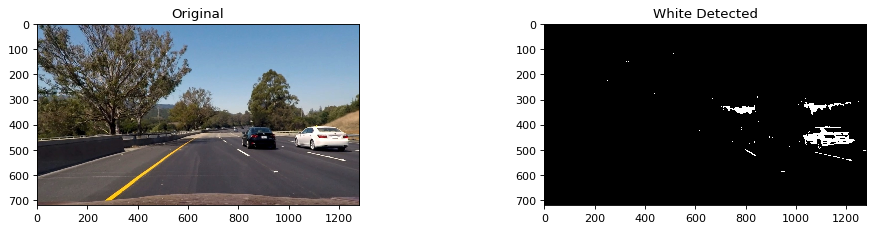

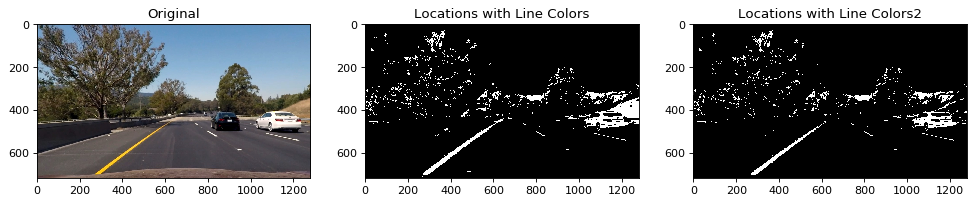

In [185]:
def line_color_threshold2(image,vthresh=(200,255)):
    [h_chan,s_chan,v_chan] = cs.split_img(cs.get_hsv(image))
    v_chan[:image.shape[0]//2] = 0

    line_colors = np.zeros_like(v_chan)
    line_colors[(v_chan > vthresh[0]) & (v_chan < vthresh[1])] = 1
    return line_colors


def line_color_threshold(image):
    [r_chan,g_chan,b_chan] = cs.split_img(image)
    [h_chan,s_chan,v_chan] = cs.split_img(cs.get_hsv(image))
    
    rg_diff = np.absolute(r_chan - g_chan)
    rb_diff = np.absolute(r_chan - b_chan)
    bg_diff = np.absolute(b_chan - g_chan)
    
    # Yellow:  minimum brightness, range for rg_diff, range for rb_diff
    r_thresh_yellow = cs.get_thresh(r_chan, thresh_min=100, thresh_max=255)
    rg_thresh_yellow = cs.get_thresh(rg_diff, thresh_min=30, thresh_max=80)
    rb_thresh_yellow = 1 - get_thresh(rb_diff, thresh_min=0, thresh_max=80)
    is_yellow = r_thresh_yellow & rg_thresh_yellow & rb_thresh_yellow
    
    r_thresh_white = cs.get_thresh(r_chan, thresh_min=200, thresh_max=255)
    v_thresh_white = cs.get_thresh(v_chan, thresh_min=220,thresh_max=255)
    rg_thresh_white = cs.get_thresh(rg_diff, thresh_min=0, thresh_max=50)
    rb_thresh_white = cs.get_thresh(rb_diff, thresh_min=0, thresh_max=50)
    bg_thresh_white = cs.get_thresh(bg_diff, thresh_min=100, thresh_max=255)
    is_white = v_thresh_white & bg_thresh_white & rb_thresh_white & rg_thresh_white

    return is_white | is_yellow #yellow | is_white #diff #_thresh #g_chan #rg_thresh# & r_thresh

def detect_yellow(image):
    img_hsv = cs.get_hsv(image)
    
    # Bright Yellow
    byellow_lower = np.array([15,55,90],dtype='uint8')
    byellow_upper = np.array([35,255,255],dtype='uint8')
    
    # Dark Yellow
    #dyellow_lower = np.array([150,1,70],dtype='uint8')
    #dyellow_upper = np.array([170,50,255],dtype='uint8')
    #dyellow_lower = np.array([15,70,10],dtype='uint8')
    #dyellow_upper = np.array([35,255,255],dtype='uint8')
    
    byellow_section = cv2.inRange(img_hsv,byellow_lower,byellow_upper)
    #dyellow_section = cv2.inRange(img_hsv,dyellow_lower,dyellow_upper)
    
    return byellow_section

def detect_yellow2(image):
    img_hsv = cs.get_hsv(image)
    
    byellow_lower = np.array([18,55,90],dtype='uint8')
    byellow_upper = np.array([27,255,255],dtype='uint8')
    byellow_section = cv2.inRange(img_hsv,byellow_lower,byellow_upper)
    
    return byellow_section

def detect_white(image):
    img_hsv = cs.get_hsv(image)
    
    # Bright Yellow
    bwhite_lower = np.array([0,0,200],dtype='uint8')
    bwhite_upper = np.array([255,25,255],dtype='uint8')
    
    # Dark Yellow
    #dyellow_lower = np.array([150,1,70],dtype='uint8')
    #dyellow_upper = np.array([170,50,255],dtype='uint8')
    #dyellow_lower = np.array([15,70,10],dtype='uint8')
    #dyellow_upper = np.array([35,255,255],dtype='uint8')
    
    bwhite_section = cv2.inRange(img_hsv,bwhite_lower,bwhite_upper)
    #dyellow_section = cv2.inRange(img_hsv,dyellow_lower,dyellow_upper)
    
    return bwhite_section

def detect_white_adaptive(image,stdmult=0.9):
    img_hsv = cs.get_hsv(image)
#    s_chan = img_hsv[image.shape[0]//2:,:,1]
    s_chan = img_hsv[:,:,1]
    s_chan_avg = np.average(s_chan)
    s_chan_std = np.std(s_chan)
    #print (s_chan_avg,s_chan_std)
    
    
    # Bright Yellow
    bwhite_lower = np.array([0,0,200],dtype='uint8')
    bwhite_upper = np.array([255,int(s_chan_avg-s_chan_std*stdmult),255],dtype='uint8')
    
    # Dark Yellow
    #dyellow_lower = np.array([150,1,70],dtype='uint8')
    #dyellow_upper = np.array([170,50,255],dtype='uint8')
    #dyellow_lower = np.array([15,70,10],dtype='uint8')
    #dyellow_upper = np.array([35,255,255],dtype='uint8')
    
    bwhite_section = cv2.inRange(img_hsv,bwhite_lower,bwhite_upper)
    #dyellow_section = cv2.inRange(img_hsv,dyellow_lower,dyellow_upper)
    
    return bwhite_section

def detect_value_step(image):
    [h_chan,s_chan,v_chan] = cs.split_img(cs.get_hsv(image))
    gradx = cs.get_sobel(v_chan, 'absx', thresh_min=10, thresh_max=255, ksize=ksize)
    
    return gradx

def detect_sat_step(image):
    [h_chan,s_chan,v_chan] = cs.split_img(cs.get_hsv(image))
    gradx = np.absolute(cs.simple_sobel(s_chan, orient='x', ksize=3))
    
    return gradx

line_color_images = []
for idx,img in enumerate(test_images_undist):
    lane_line_colors = detect_white_adaptive(img) | detect_yellow(img) #line_color_threshold(image)
    just_yellow = detect_yellow2(img)
    just_white = detect_white_adaptive(img)
    lane_line_colors2 = detect_white_adaptive(img) | detect_yellow2(img) #line_color_threshold(image)
    #lane_line_colors = detect_value_step(image) & detect_white_adaptive(image,stdmult=0.5)#detect_yellow(image) #line_color_threshold(image)
    #lane_line_colors = detect_value_step(image)
    line_color_images += [lane_line_colors]

    pres.multi_graph([img,just_yellow],["Original","Yellow Detected"])
    pres.multi_graph([img,just_white],["Original","White Detected"])
    pres.multi_graph([img,lane_line_colors,lane_line_colors2],["Original","Locations with Line Colors","Locations with Line Colors2"])

### Perspective Transform

(720, 1280, 3)


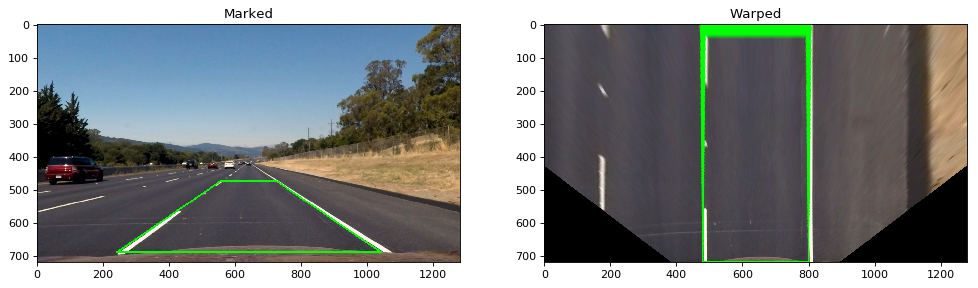

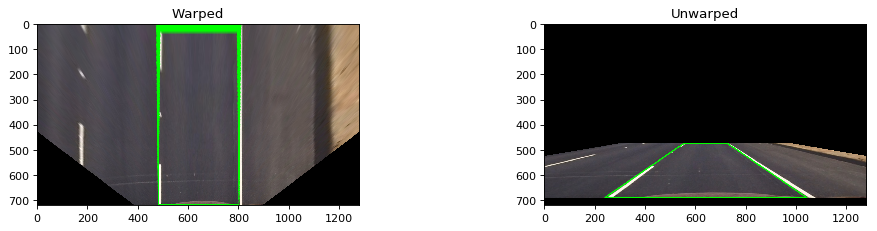

In [198]:
# First, need to find the correct points
# Using straight_lines2.jpg inside GIMP, measured 4 points:
print(test_images_undist[0].shape)
old_pts = np.float32([[241,690],[555,475],[725,475],[1041,690]])
new_pts = np.float32([[1280*3//8,719],[1280*3//8,0],[1280*5//8,0],[1280*5//8,719]])

pts = np.int32(old_pts).reshape((-1,1,2))

persp_txfr = cam.PERSPECTIVE(old_pts,new_pts)
for idx,img in enumerate(test_images_undist):
    if idx!=1: continue
    marked_img = np.copy(img)
    marked_img = cv2.polylines(marked_img,[pts],True,(0,255,0),4)
    warped = persp_txfr.warp(marked_img)
    unwarped = persp_txfr.unwarp(warped)
    #pres.multi_graph([img,marked_img,warped,unwarped],["Original","Marked","Warped","Unwarped"])
    pres.multi_graph([marked_img,warped],["Marked","Warped"],big=True)
    pres.multi_graph([warped,unwarped],["Warped","Unwarped"])

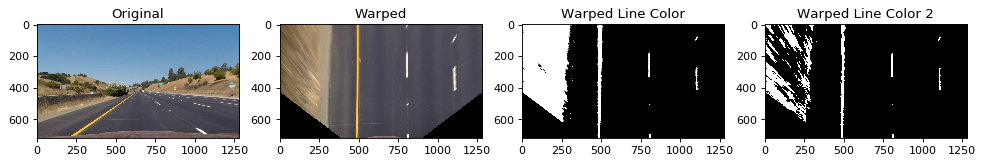

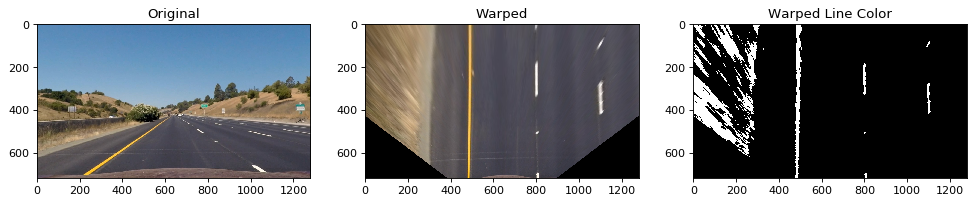

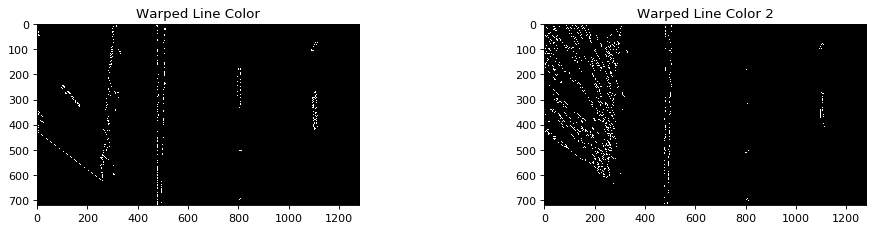

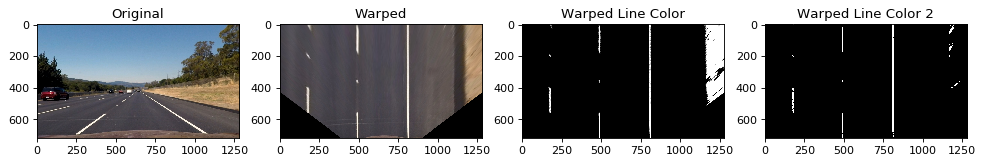

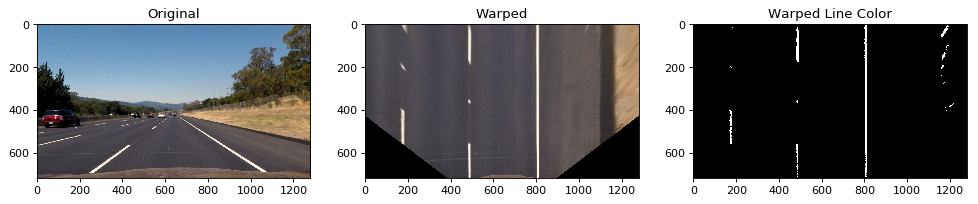

...

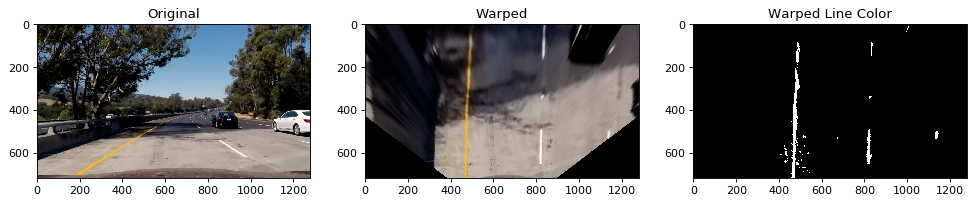

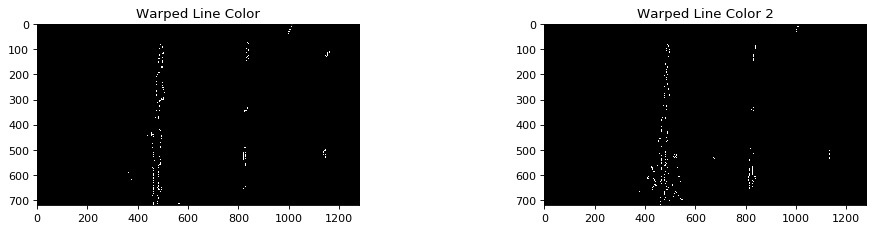

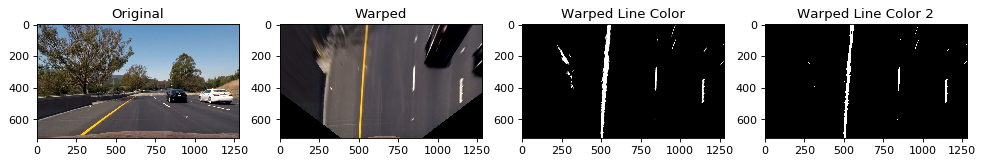

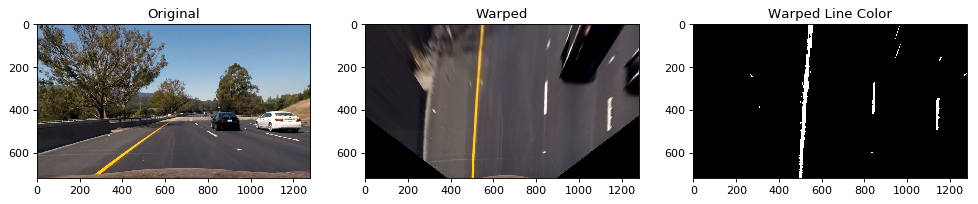

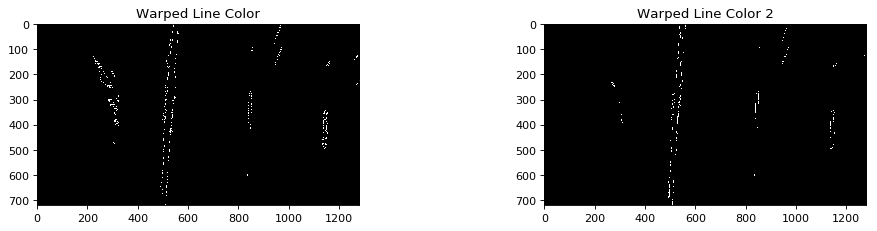

In [189]:
# Apply to Lane Line Images
persp_tx_images = []
persp_tx_lci = [] # lane color images
for idx,img in enumerate(test_images_undist):
    warped = persp_txfr.warp(img)
    persp_tx_images += [warped]
    lane_line_colors = detect_white_adaptive(warped,stdmult=0.25) | detect_yellow2(warped)
    warped_lci = persp_txfr.warp(line_color_images[idx])
    persp_tx_lci += [warped_lci]
    
    c1 = 0.1
    c2 = 255
    pres.multi_graph([img,warped,warped_lci,lane_line_colors],["Original","Warped","Warped Line Color","Warped Line Color 2"])
    pres.multi_graph([img,warped,lane_line_colors],["Original","Warped","Warped Line Color"])
    pres.multi_graph([cv2.Canny(warped_lci,c1,c2),cv2.Canny(lane_line_colors,c1,c2)],["Warped Line Color","Warped Line Color 2"])


## Final Lane Line Detection Algorithms and Building the LANELINES Object

In [213]:
def det_lc2(img):
    img_hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    f = 0.5
    fspread = 0.9
    ksize = 3
    grad_atan_s = cs.get_sobel(img_hls, 'atan', thresh_min=f-fspread, thresh_max=fspread+f, chan=2, ksize=ksize)
    grad_abs_s  = cs.get_sobel(img_hls, 'abs', thresh_min=12, thresh_max=255, chan=2, ksize=ksize)
    
    scaled_l = np.asarray(255.*img_hls[:,:,1]/np.max(img_hls[:,:,1]),dtype='uint8')
    scaled_l_thresh = cs.get_thresh(scaled_l, thresh_min=64, thresh_max=255)
    grad_img = grad_atan_s & grad_abs_s & scaled_l_thresh
    return grad_img


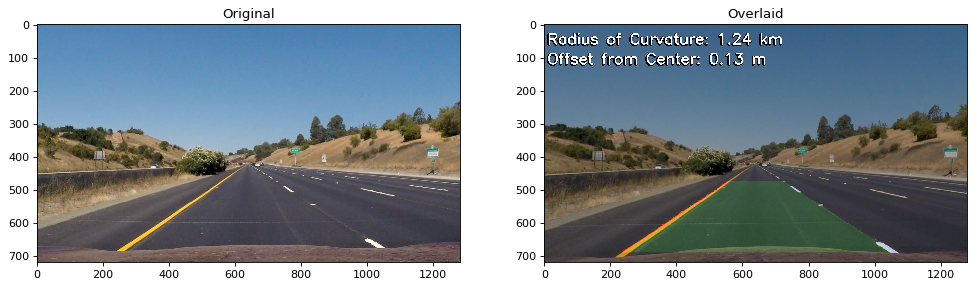

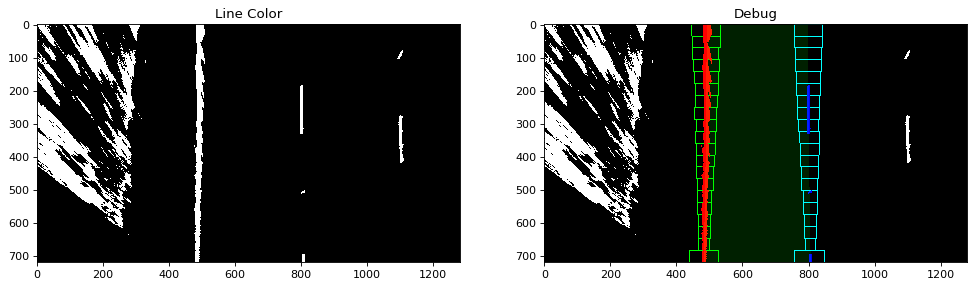

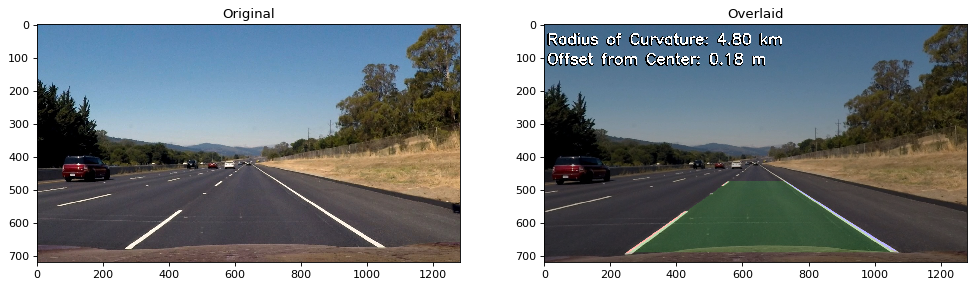

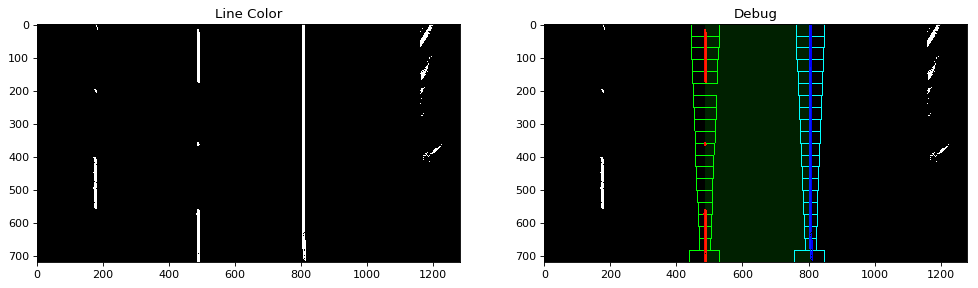

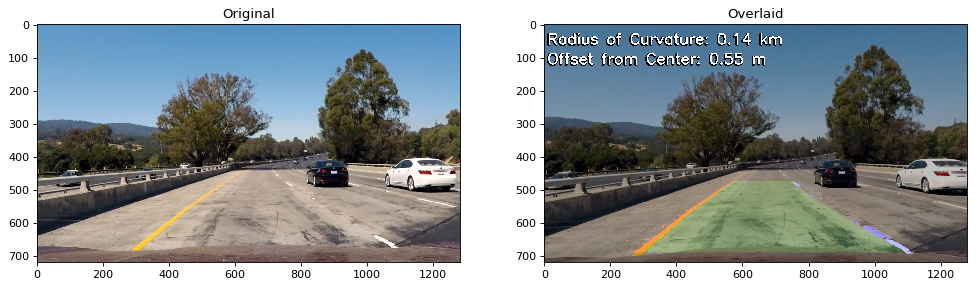

...

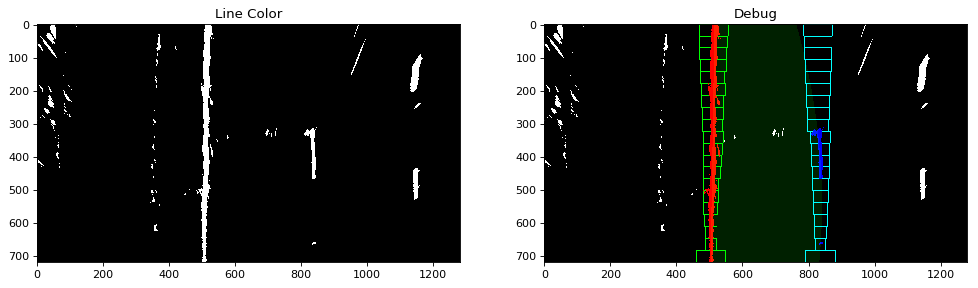

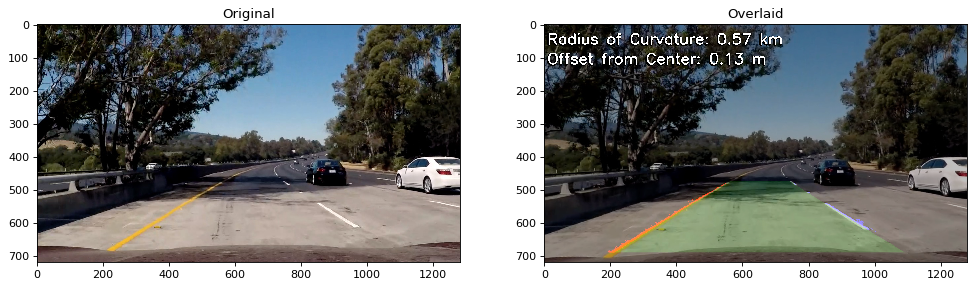

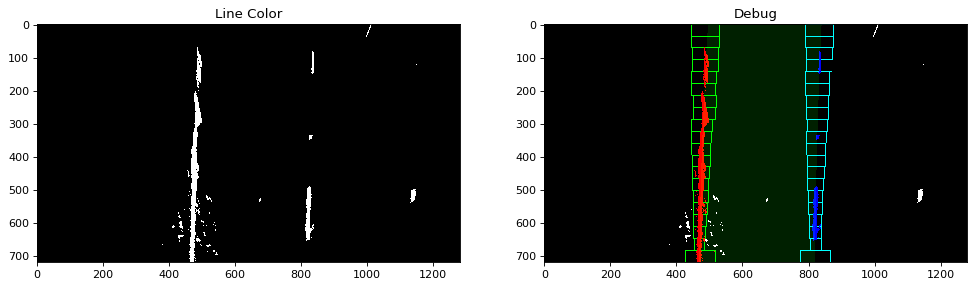

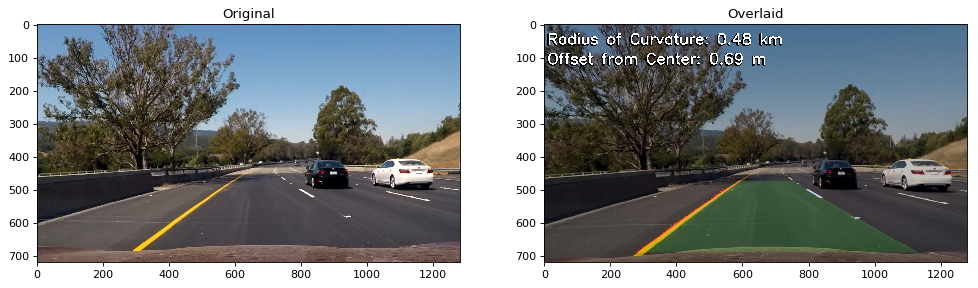

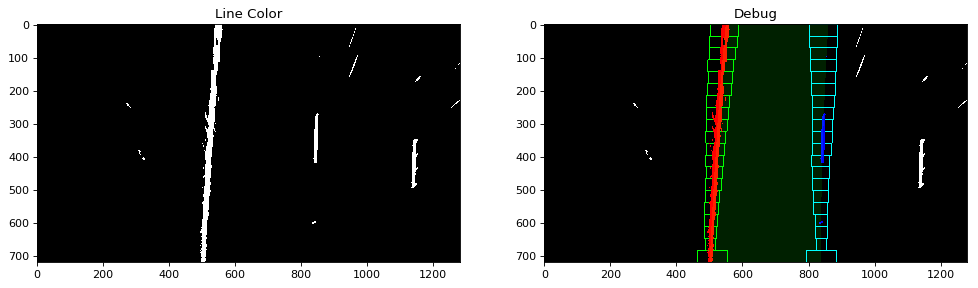

In [219]:
def det_lc(img):
    return detect_yellow2(img)| detect_white_adaptive(img,stdmult=0.15)

def det_lc_canny(img):
    c1 = 0.1
    c2 = 255
    return cv2.Canny(det_lc(img),c1,c2)

lanelines = ll.LANELINES(camera_cal,persp_txfr,[det_lc]) #,det_lc_canny])
for idx,img in enumerate(persp_tx_lci):
    lanelines.feed_lc_images([img])
for idx,img in enumerate(test_images):
    #if idx!=1: continue
    rd = lanelines.feed_raw_image(img,isVideo=False,debug=True)
    ovimg = rd['overlaid']
    lcimg = rd['lc_images'][0]
    dbimg = rd['debug_img']
    pres.multi_graph([img,ovimg],["Original","Overlaid"],big=True)
    pres.multi_graph([lcimg,dbimg],["Line Color","Debug"],big=True)
    #pres.multi_graph([dbimg],["Debug"],big=True)
    

### Video Frame Processing Function Defintion and Test

In [220]:
def process_image(img,debug=False):
    rd = lanelines.feed_raw_image(img,debug=debug,isVideo=True)

    if debug:
        return rd['debug_img']
    else:
        return rd['overlaid']

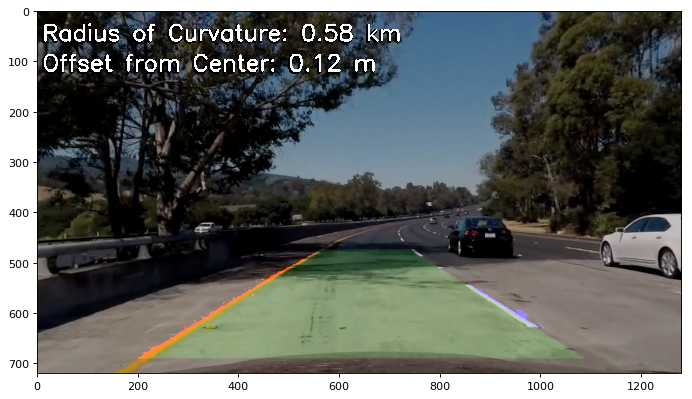

In [221]:
lanelines.reset()
test_out = process_image(test_images_undist[6])
pres.multi_graph([test_out],big=True)
plt.imsave("output_images/debug.png",test_out)

### Process Videos

In [222]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [223]:
#reset_lane_smoothing() # Necessary at start of new content
#
for clipname in ["project_video", "challenge_video", "harder_challenge_video"]:
    lanelines.reset()
    #if clipname == "project_video":continue
    
    movie_output = "output_images/%s_out.mp4" % clipname
    ## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
    ## To do so add .subclip(start_second,end_second) to the end of the line below
    ## Where start_second and end_second are integer values representing the start and end of the subclip
    ## You may also uncomment the following line for a subclip of the first 5 seconds
    ##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)

    clip1 = VideoFileClip("%s.mp4" % clipname)#.subclip(3,7)
    movie_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
    %time movie_clip.write_videofile(movie_output, audio=False)

[MoviePy] >>>> Building video output_images/project_video_out.mp4
[MoviePy] Writing video output_images/project_video_out.mp4


100%|█████████▉| 1260/1261 [01:43<00:00, 12.33it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video_out.mp4 

CPU times: user 4min 14s, sys: 1.1 s, total: 4min 15s
Wall time: 1min 43s
[MoviePy] >>>> Building video output_images/challenge_video_out.mp4
[MoviePy] Writing video output_images/challenge_video_out.mp4


100%|██████████| 485/485 [00:38<00:00, 12.59it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/challenge_video_out.mp4 

CPU times: user 1min 36s, sys: 492 ms, total: 1min 37s
Wall time: 39 s
[MoviePy] >>>> Building video output_images/harder_challenge_video_out.mp4
[MoviePy] Writing video output_images/harder_challenge_video_out.mp4


100%|█████████▉| 1199/1200 [01:46<00:00, 11.71it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/harder_challenge_video_out.mp4 

CPU times: user 4min 16s, sys: 1.12 s, total: 4min 17s
Wall time: 1min 47s
